# EDA 

Author: hshin337@gatech.edu  
Date: 1/31/2026  

## Findings

1. Traing date range 
    - Start 2010-07-18 
    - End 2025-12-31

2. Prefered columns
     - Date, AdrActCnt, BlkCnt, FlowInExNtv, FlowOutExNtv, TxCnt, ...

2. Drop columns  
    - AseetCreateTime, Asset_IssueTime: meta data for data pipeline, no need for modeling
    - ReferenceRate, ReferenceRateETH, ReferenceRateEUR, ReferenceRateUSD: Focusing on BTC not other
    - PriceBTC: Always 1
    - CapMrktCurUSD / CapMrktEstUSD / CapMrktFFUSD: Duplicated value 

3. Missing value handling
     - No missing value handling for PriceUSD, CapMVRVCur, CapMrktCurUSD, FlowInExUSD because we are going to use data that greater than 2017 


In [1]:
from pathlib import Path
import polars as pl
import seaborn as sns
import matplotlib.pyplot as plt
from eda_starter_template import (
    load_bitcoin_data, 
    load_polymarket_data, 
    analyze_btc_metrics, 
    analyze_polymarket_summary, 
    plot_btc_price, 
    plot_polymarket_volume
)

# --- Configuration ---
# Robustly determine the project root directory
SCRIPT_DIR = Path().resolve()
PROJECT_ROOT = SCRIPT_DIR.parent
DATA_DIR = PROJECT_ROOT / "data"
PLOTS_DIR = SCRIPT_DIR / "plots"
COINMETRICS_PATH = DATA_DIR / "Coin Metrics" / "coinmetrics_btc.csv"
POLYMARKET_DIR = DATA_DIR / "Polymarket"

print(f"Project root directory: {PROJECT_ROOT}")

Project root directory: C:\Users\hyuns\workspace\GT-MSA-Spring-2026-Team-09


## Bitcoin

In [2]:
df_btc = load_bitcoin_data(COINMETRICS_PATH)
df_btc

Loading Bitcoin data from C:\Users\hyuns\workspace\GT-MSA-Spring-2026-Team-09\data\Coin Metrics\coinmetrics_btc.csv...
[Memory] Before loading Bitcoin data: 209.30 MB
[Memory] After loading Bitcoin data: 229.63 MB (Δ 20.32 MB)
Successfully loaded 6221 rows.


time,AdrActCnt,AdrBalCnt,AssetCompletionTime,AssetEODCompletionTime,BlkCnt,CapMVRVCur,CapMrktCurUSD,CapMrktEstUSD,FeeTotNtv,FlowInExNtv,FlowInExUSD,FlowOutExNtv,FlowOutExUSD,HashRate,IssTotNtv,IssTotUSD,PriceBTC,PriceUSD,ROI1yr,ROI30d,ReferenceRate,ReferenceRateETH,ReferenceRateEUR,ReferenceRateUSD,SplyCur,SplyExNtv,SplyExUSD,SplyExpFut10yr,TxCnt,TxTfrCnt,volume_reported_spot_usd_1d
datetime[μs],i64,i64,i64,i64,i64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,i64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,i64,i64,f64
2009-01-03 00:00:00,0,0,1614334883,1614334883,0,null,null,null,0.0,0.0,null,0.0,null,null,null,null,1,null,null,null,null,null,null,null,0.0,0.0,null,null,0,0,null
2009-01-04 00:00:00,0,0,1614334883,1614334883,0,null,null,null,0.0,0.0,null,0.0,null,null,null,null,1,null,null,null,null,null,null,null,0.0,0.0,null,null,0,0,null
2009-01-05 00:00:00,0,0,1614334883,1614334883,0,null,null,null,0.0,0.0,null,0.0,null,null,null,null,1,null,null,null,null,null,null,null,0.0,0.0,null,null,0,0,null
2009-01-06 00:00:00,0,0,1614334884,1614334884,0,null,null,null,0.0,0.0,null,0.0,null,null,null,null,1,null,null,null,null,null,null,null,0.0,0.0,null,null,0,0,null
2009-01-07 00:00:00,0,0,1614334885,1614334885,0,null,null,null,0.0,0.0,null,0.0,null,null,null,null,1,null,null,null,null,null,null,null,0.0,0.0,null,null,0,0,null
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
2026-01-10 00:00:00,608784,55908713,1768101454,1768101454,162,1.610013,1.8058e12,1.8058e12,2.0853467,25172.379573,2.2757e9,25704.121161,2.3238e9,1.1796e9,506.25,4.5768e7,1,90406.142411,-4.593729,-2.394179,90539.603229,29.348301,77853.756824,90539.603229,1.9974e7,2.4808e6,2.2428e11,2.0826e7,492984,1049925,2.9985e9
2026-01-11 00:00:00,536405,55924280,1768186822,1768186822,122,1.615856,1.8120e12,1.8120e12,1.915416,27810.205536,2.5229e9,24486.469835,2.2213e9,8.8831e8,381.25,3.4586e7,1,90717.206315,-4.11103,0.426869,90406.142411,29.333069,77790.505193,90406.142411,1.9974e7,2.4846e6,2.2539e11,2.0826e7,289219,572262,4.3998e9
2026-01-12 00:00:00,638422,55917951,1768275291,1768275291,142,1.623512,1.8205e12,1.8205e12,2.3225772,26842.012928,2.4464e9,29771.239469,2.7134e9,1.0339e9,443.75,4.0444e7,1,91141.149849,-3.404872,0.99272,90717.206315,29.145653,78047.851052,90717.206315,1.9975e7,2.4821e6,2.2622e11,2.0826e7,405384,845895,1.3448e10


In [3]:
analyze_btc_metrics(df_btc)


--- Bitcoin Data Summary ---
shape: (9, 4)
┌────────────┬───────────────┬───────────────┬───────────┐
│ statistic  ┆ PriceUSD      ┆ CapMrktCurUSD ┆ HashRate  │
│ ---        ┆ ---           ┆ ---           ┆ ---       │
│ str        ┆ f64           ┆ f64           ┆ f64       │
╞════════════╪═══════════════╪═══════════════╪═══════════╡
│ count      ┆ 5659.0        ┆ 5659.0        ┆ 6214.0    │
│ null_count ┆ 562.0         ┆ 562.0         ┆ 7.0       │
│ mean       ┆ 19809.987841  ┆ 3.8264e11     ┆ 1.5146e8  │
│ std        ┆ 29699.078673  ┆ 5.8737e11     ┆ 2.6345e8  │
│ min        ┆ 0.050541      ┆ 177670.489754 ┆ 1.9884e-7 │
│ 25%        ┆ 260.651331    ┆ 3.6730e9      ┆ 62.554011 │
│ 50%        ┆ 5728.351702   ┆ 9.7931e10     ┆ 5.5673e6  │
│ 75%        ┆ 28844.613678  ┆ 5.5492e11     ┆ 1.6529e8  │
│ max        ┆ 124824.453667 ┆ 2.4879e12     ┆ 1.3055e9  │
└────────────┴───────────────┴───────────────┴───────────┘
Saved btc_correlation_matrix.png


In [4]:
plot_btc_price(df_btc)

Saved btc_price_history.png


Bitcoin price chart  

![btc_price](./plots/btc_price_history.png)

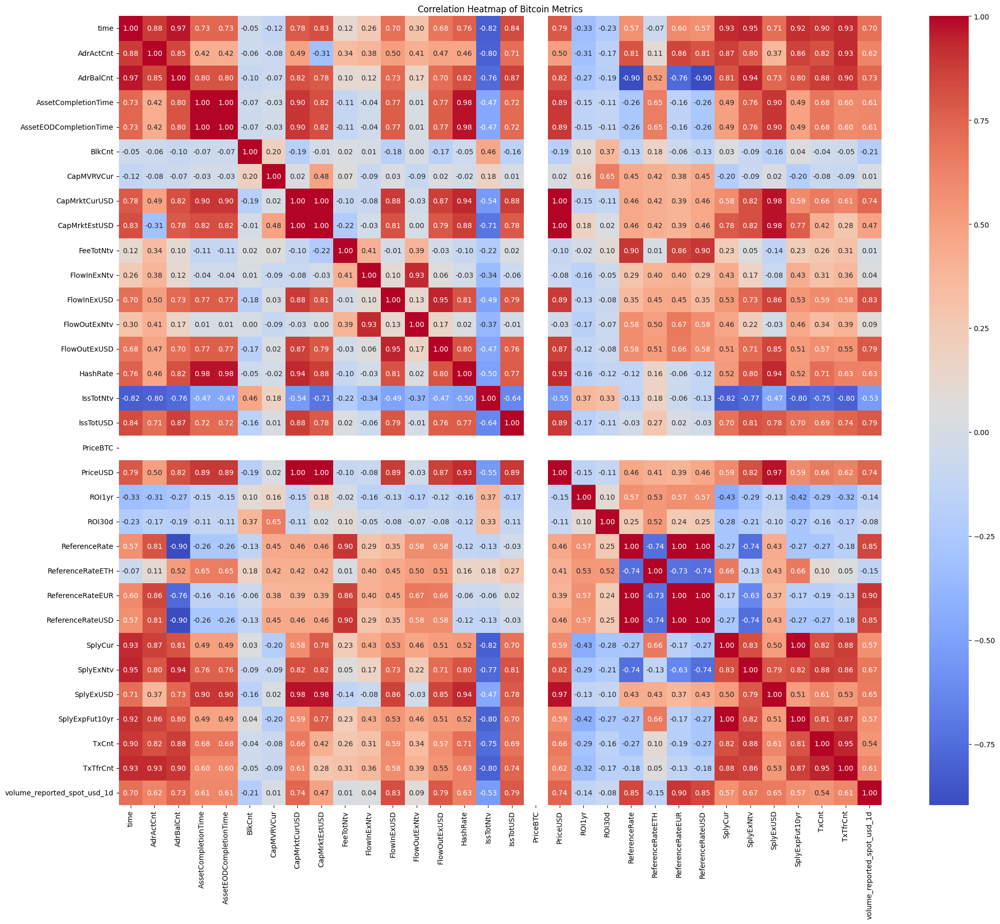

In [5]:
# corr heatmap
plt.figure(figsize=(24, 20))
sns.heatmap(df_btc.to_pandas().corr(), annot=True, fmt=".2f", cmap="coolwarm")
plt.title("Correlation Heatmap of Bitcoin Metrics")
plt.show()

In [29]:
plt.figure(figsize=(36, 36))
sns.pairplot(data=df_btc.to_pandas())

<Figure size 3600x3600 with 0 Axes>

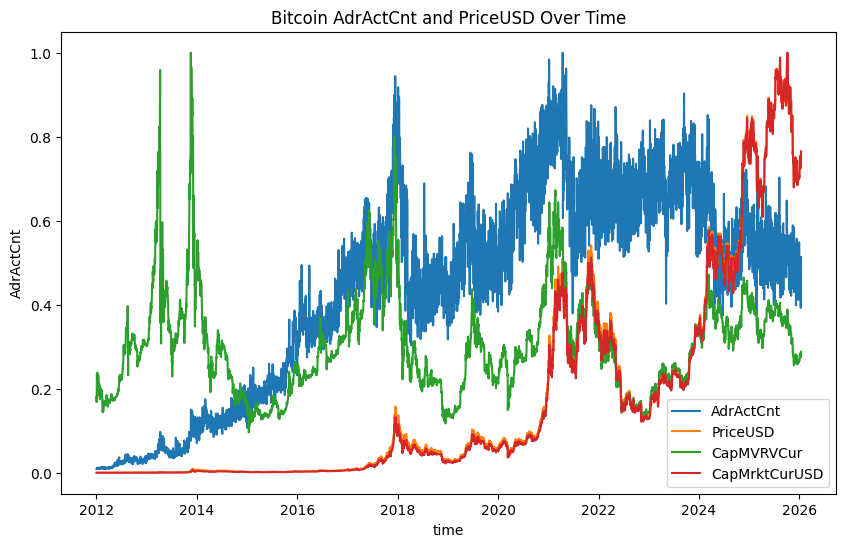

In [50]:
# plot mulitple metrics in line plot using seaborn
df_btc_2012_later = df_btc.filter(pl.col('time') > pl.datetime(2012,1,1))
plt.figure(figsize=(10, 6))
sns.lineplot(data=df_btc_2012_later.to_pandas(), x='time', y=df_btc_2012_later['AdrActCnt']/df_btc_2012_later['AdrActCnt'].max(), label='AdrActCnt')
sns.lineplot(data=df_btc_2012_later.to_pandas(), x='time', y=df_btc_2012_later['PriceUSD']/df_btc_2012_later['PriceUSD'].max(), label='PriceUSD')
sns.lineplot(data=df_btc_2012_later.to_pandas(), x='time', y=df_btc_2012_later['CapMVRVCur']/df_btc_2012_later['CapMVRVCur'].max(), label='CapMVRVCur')
sns.lineplot(data=df_btc_2012_later.to_pandas(), x='time', y=df_btc_2012_later['CapMrktCurUSD']/df_btc_2012_later['CapMrktCurUSD'].max(), label='CapMrktCurUSD')
plt.title('Bitcoin AdrActCnt and PriceUSD Over Time')
plt.show()

# df_btc.plot(x='time', y=, subplots=True, figsize=(10, 6))

In [6]:
df_btc['CapMrktEstUSD']

CapMrktEstUSD
f64
null
null
null
null
null
…
1.8058e12
1.8120e12
1.8205e12


In [12]:
print("end of EDA")

end of EDA
